## 2. Data Cleaning, Pre-processing
Now that we have obtained our data, we will take our first looks into it, seeking out missing values and choosing which parts of the data set will be useful for our classifier. We will also begin pre-processing the text data with natuaral language tools. This section concludes with some exploratory data analysis and visualisations.

In [2]:
#IMPORTING LIBRARIES:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', 100)
sns.set_style("darkgrid")

from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import re

from sklearn.feature_extraction.text import CountVectorizer

#WORDCLOUD
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image
#WORDNINJA
import wordninja


%matplotlib inline
import scattertext as st
import re, io
from pprint import pprint
from scipy.stats import rankdata, hmean, norm
import spacy
import os, pkgutil, json, urllib
from urllib.request import urlopen
from IPython.display import IFrame
from IPython.core.display import display, HTML
from scattertext import CorpusFromPandas, produce_scattertext_explorer
display(HTML("<style>.container { width:98% !important; }</style>"))

/Users/mayureshbhangale/miniconda3/envs/marshmalone3.8/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/var/folders/9h/x3gkqsdn68q_z6ktbkx8q5h00000gn/T/ipykernel_30269/1077451280.py:33: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


### 2.1 Data Cleaning 

> **Cutting down the dataset** - As both sets have 100 columns, it'll be wise to choose a few columns that will be useful as our predictors. 

> **Concatenation** - As we have already created a "is_suicide" column indicating which subreddit the posts are from, we should concatenate both datasets together. 

> **Imputation** - If there are missing values, we should find a way to impute the data. 

In [3]:
#IMPORTING CSV FILES
depression = pd.read_csv('../data/depression.csv')
suicide_watch = pd.read_csv('../data/suicide_watch.csv')

In [4]:
#PEEKING INTO THE DEPRESSION DATA SET
pd.set_option('display.max_columns', 500)
depression.head()

,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,subreddit_name_prefixed,hidden,pwls,link_flair_css_class,downs,hide_score,name,quarantine,link_flair_text_color,author_flair_background_color,subreddit_type,ups,total_awards_received,media_embed,author_flair_template_id,is_original_content,user_reports,secure_media,is_reddit_media_domain,is_meta,category,secure_media_embed,link_flair_text,can_mod_post,score,approved_by,author_premium,thumbnail,edited,author_flair_css_class,author_flair_richtext,gildings,content_categories,is_self,mod_note,created,link_flair_type,wls,removed_by_category,banned_by,author_flair_type,domain,allow_live_comments,selftext_html,likes,suggested_sort,banned_at_utc,view_count,archived,no_follow,is_crosspostable,pinned,over_18,all_awardings,awarders,media_only,can_gild,spoiler,locked,author_flair_text,visited,removed_by,num_reports,distinguished,subreddit_id,mod_reason_by,removal_reason,link_flair_background_color,id,is_robot_indexable,report_reasons,author,discussion_type,num_comments,send_replies,whitelist_status,contest_mode,mod_reports,author_patreon_flair,author_flair_text_color,permalink,parent_whitelist_status,stickied,url,subreddit_subscribers,created_utc,num_crossposts,media,is_video,is_suicide
0,NaN,depression,We understand that most people who reply immed...,t2_1t70,False,NaN,0,False,Our most-broken and least-understood rules is ...,[],r/depression,False,0.0,NaN,0,False,t3_doqwow,False,dark,NaN,public,1818,0,{},NaN,False,[],NaN,False,False,NaN,{},NaN,False,1818,NaN,True,NaN,False,NaN,[],{},NaN,True,NaN,1.572390e+09,text,0.0,NaN,NaN,text,self.depression,False,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,confidence,NaN,NaN,False,False,False,False,False,[],[],False,False,False,False,NaN,False,NaN,NaN,moderator,t5_2qqqf,NaN,NaN,NaN,doqwow,True,NaN,SQLwitch,NaN,133,True,no_ads,False,[],False,NaN,/r/depression/comments/doqwow/our_mostbroken_a...,no_ads,True,https://www.reddit.com/r/depression/comments/d...,611580,1.572361e+09,0,NaN,False,0
1,NaN,depression,Welcome to /r/depression's check-in post - a p...,t2_64qjj,False,NaN,0,False,Regular Check-In Post,[],r/depression,False,0.0,NaN,0,False,t3_exo6f1,False,dark,NaN,public,310,0,{},NaN,False,[],NaN,False,False,NaN,{},NaN,False,310,NaN,False,NaN,False,NaN,[],{},NaN,True,NaN,1.580678e+09,text,0.0,NaN,NaN,text,self.depression,True,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,new,NaN,NaN,False,False,False,False,False,[],[],False,False,False,False,NaN,False,NaN,NaN,moderator,t5_2qqqf,NaN,NaN,NaN,exo6f1,True,NaN,circinia,NaN,1644,False,no_ads,False,[],False,NaN,/r/depression/comments/exo6f1/regular_checkin_...,no_ads,True,https://www.reddit.com/r/depression/comments/e...,611580,1.580649e+09,0,NaN,False,0
2,NaN,depression,I've been feeling really depressed and lonely ...,t2_17aooz,False,NaN,0,False,I hate it so much when you try and express you...,[],r/depression,False,0.0,NaN,0,False,t3_fedwbi,False,dark,NaN,public,89,0,{},NaN,False,[],NaN,False,False,NaN,{},NaN,False,89,NaN,False,NaN,False,NaN,[],{},NaN,True,NaN,1.583532e+09,text,0.0,NaN,NaN,text,self.depression,False,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt...",NaN,confidence,NaN,NaN,False,False,False,False,False,[],[],False,False,False,False,NaN,False,NaN,NaN,NaN,t5_2qqqf,NaN,NaN,NaN,fedwbi,True,NaN,TheNewKiller69,NaN,8,True,no_ads,False,[],False,NaN,/r/depression/comments/fedwbi/i_hate_it_so_muc...,no_ads,False,https://www.reddit.com/r/depression/comments/f...,611580,1.583503e+09,0,NaN,False,0
3,NaN,depression,I literally broke down crying and asked to go ...,t2_5v2j4itq,False,NaN,0,False,I went to the hospital because I was having re...,[],r/depression,False,0.0,NaN,0,False,t3_feel0k,False,dark,NaN,public,39,0,{},NaN,False,[],NaN,False,False,NaN,{},NaN,False,39,NaN,False,NaN,False,NaN,[],{},NaN,True,NaN,1.583535e+09,text,0.0,NaN,NaN,text,self.depression,False,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt

#### Note: Choosing relevant columns

> **Title and Post** -  We felt that the text data in the both the title and the post itself can potentially serve our classifier well. 

> **Author's handle and number of comments** - The author's name and the number of comments are curve ball choices. There just might be some connection between a user's handle and his/her psyche. There also might be a connection between the number of comments made.

> **URL** - We left the URL in for reference. In case we'd want to look deeper into a particular post. 

In [5]:
#WE'VE PICKED OUT FIVE COLUMNS THAT COULD HELP IN OUR EDA.
#LOOKING AT THOSE COLUMNS FOR r/depression 
depression[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].head(3)

,title,selftext,author,num_comments,is_suicide,url
0,Our most-broken and least-understood rules is ...,We understand that most people who reply immed...,SQLwitch,133,0,https://www.reddit.com/r/depression/comments/d...
1,Regular Check-In Post,Welcome to /r/depression's check-in post - a p...,circinia,1644,0,https://www.reddit.com/r/depression/comments/e...
2,I hate it so much when you try and express you...,I've been feeling really depressed and lonely ...,TheNewKiller69,8,0,https://www.reddit.com/r/depression/comments/f...


In [6]:
#WE'VE PICKED OUT FIVE COLUMNS THAT COULD HELP IN OUR EDA.
#LOOKING AT THOSE COLUMNS FOR r/Suicide_Watch

suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].head(3)

,title,selftext,author,num_comments,is_suicide,url
0,New wiki on how to avoid accidentally encourag...,We've been seeing a worrying increase in pro-s...,SQLwitch,260,1,https://www.reddit.com/r/SuicideWatch/comments...
1,Reminder: Absolutely no activism of any kind i...,"If you want to recognise an occasion, please d...",SQLwitch,124,1,https://www.reddit.com/r/SuicideWatch/comments...
2,To every single poster here i wanne say one thing,I really fucking feel you,NussNougatCroissant,46,1,https://www.reddit.com/r/SuicideWatch/comments...


In [7]:
#COMPARING SHAPES OF BOTH TABLES
depression[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].shape

(917, 6)

In [8]:
suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]].shape

(980, 6)

In [9]:
#READING A RANDOM POST FROM r/depression
print(depression["selftext"][118])
len(depression["selftext"][118])

Hello. Depression has always been a secondary problem for me, with my main antagonist being severe Harm OCD. But since my relationship ended 8 months ago, I've been stuck in this horrific cycle of absolutely loathing myself, feeling heavy/tired and totally unmotivated to do anything. It's like I'm living in a 2 dimensional world. Nothing in life jumps out and catches my attention like it used to. I used to be quite creative but it's just taken a nose dive. Any work I do is utterly awful and I'm amazed I'm not been kicked off projects (I work freelance). I wake up and I just want to be dead, quite honestly. In fact in the last few weeks I've even found getting out of bed to be a monumental struggle in itself, where I'm almost in tears from the weight of everything.

I am getting help with a therapist and am on an SSRI/low dose anti psych. And I've taken their advice seriously in terms of behavioural activation and avoiding staying in bed. I've started cycling again (just done 20 miles t

1595

In [10]:
#READING A RANDOM POST FROM r/SuicideWatch
#I SUSPECT THE POSTS FROM r/SuicideWatch MIGHT BE SHORTER.
#MIGHT BE WORTH CHECKING OUT IN AN EDA LATER
print(suicide_watch["selftext"][118])
len(suicide_watch["selftext"][118])

I'm an 18 year old with severe depression, anxiety, ADHD, borderline personality disorder and DID at a point in my life. But I'm slowly recovering.

I have always felt like I never belonged to this world, because I am "too imaginative" and "too kind". I behave "not like how people should". I'm mostly well-liked, but I know they think I'm a weirdo. Everyone does.

It's final exam time for us, and I have to secure good marks, otherwise I won't be able to enter any good streams in a good college. It would be the end of my future. My family is in a financial crunch, but they give up everything for me. I am dead-set on helping my friends get through their depression and suicidal tendencies, but I'm failing at that. I have had three attempts, but I was saved by a person, who himself was alexithymic (I think) and suicidal. He still is, and he says if he doesn't do well, he will commit suicide.

I don't know what I'm gonna do if I don't perform the way I should. But I certainly know that I wil

1172

In [11]:
#WE'LL CONCAT THE SELECTED PARTS OF BOTH DATASETS BEFORE CLEANING IT
dep_columns = depression[["title", "selftext", "author",  "num_comments", "is_suicide","url"]]
sui_columns = suicide_watch[["title", "selftext", "author",  "num_comments", "is_suicide","url"]]
combined_data = pd.concat([dep_columns,sui_columns],axis=0, ignore_index=True)    
combined_data

,title,selftext,author,num_comments,is_suicide,url
0,Our most-broken and least-understood rules is ...,We understand that most people who reply immed...,SQLwitch,133,0,https://www.reddit.com/r/depression/comments/d...
1,Regular Check-In Post,Welcome to /r/depression's check-in post - a p...,circinia,1644,0,https://www.reddit.com/r/depression/comments/e...
2,I hate it so much when you try and express you...,I've been feeling really depressed and lonely ...,TheNewKiller69,8,0,https://www.reddit.com/r/depression/comments/f...
3,I went to the hospital because I was having re...,I literally broke down crying and asked to go ...,Jazzlecrab,15,0,https://www.reddit.com/r/depression/comments/f...
4,Cake day for me,Any kind soul want to give a depressed person ...,Depressed_Kid786,37,0,https://www.reddit.com/r/depression/comments/f...
...,...,...,...,...,...,...
1892,I'm in so much pain,It's so hard just to get out of bed every morn...,BigPete543,6,1,https://www.reddit.com/r/SuicideWatch/comments...
1893,I'm too stupid to achieve anything in life. I'...,I have a low IQ. Twice I've been tested and bo...,Elisbt,3,1,https://www.reddit.com/r/SuicideWatch/comments...
1894,Useless,"I don't feel useless, im useless.",Gayhova,5,1,https://www.reddit.com/r/SuicideWatch/comments...
1895,I wish it was as easy as disappearing into thi...,I wish there was some way I could will myself ...,evofe,1,1,https://www.reddit.com/r/SuicideWatch/comments...


In [12]:
#BACKING UP combined_data IN A CSV FILE
combined_data.to_csv('../data/combined_data.csv', index = False)

In [13]:
#CHECKING FOR MISSING DATA
#THERE ARE ONLY NULL VALUES IN OUR selftext COLUMN
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1897 entries, 0 to 1896
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   title         1897 non-null   object
 1   selftext      1832 non-null   object
 2   author        1897 non-null   object
 3   num_comments  1897 non-null   int64 
 4   is_suicide    1897 non-null   int64 
 5   url           1897 non-null   object
dtypes: int64(2), object(4)
memory usage: 89.0+ KB


In [14]:
#CHECKING OUT THE ROWS WITH MISSING selftext DATA
combined_data[combined_data["selftext"].isnull()].head(10)

,title,selftext,author,num_comments,is_suicide,url
184,Can someone recommend good qualities in therap...,NaN,eito_8,2,0,https://www.reddit.com/r/depression/comments/f...
921,"Nobody gives a fuck until you die, and even th...",NaN,lil_peemis,3,1,https://www.reddit.com/r/SuicideWatch/comments...
923,I have two brothers who have killed themselves...,NaN,ArsenalOwl,1,1,https://www.reddit.com/r/SuicideWatch/comments...
925,I want to die I want to die I want to die,NaN,alynde,4,1,https://www.reddit.com/r/SuicideWatch/comments...
934,"I am so sorry, but it has gotten worse",NaN,SmushyKidK,4,1,https://www.reddit.com/r/SuicideWatch/comments...
937,I want to douse my body in gasoline and set my...,NaN,SalehRobbins,3,1,https://www.reddit.com/r/SuicideWatch/comments...
941,I can't do this anymore,NaN,sappy_banana,4,1,https://www.reddit.com/r/SuicideWatch/comments...
957,"If I had a gun, I’d blow my fucking brains out...",NaN,CGM2004,1,1,https://www.reddit.com/r/SuicideWatch/comments...
960,This world is a joke.,NaN,crybaby1577,11,1,https://www.reddit.com/r/SuicideWatch/comments...
964,I think I’m ready,NaN,___horse___,4,1,https://www.reddit.com/r/SuicideWatch/comments...


In [15]:
#THE NaNs APPEAR OVERWHELMINGLY IN r/SuicideWatch POSTS (98.46%)
#IT MIGHT BE IMPORTANT TO DIG INTO THE TITLES OF THESE POSTS LATER
#WE WILL NOT DROP THESE ROWS
#DATA IMPUTATION DECISION MADE: REPLACE NaNs WITH "emptypost"
combined_data["is_suicide"][combined_data["selftext"].isnull()].value_counts()

is_suicide
1    64
0     1
Name: count, dtype: int64

In [16]:
#FILLING NaNs
combined_data["selftext"].fillna("emptypost",inplace=True)

In [17]:
#CHECKING IF NaNs WERE FILLED IN
combined_data[combined_data["selftext"].isin(["emptypost"])].head()

,title,selftext,author,num_comments,is_suicide,url
184,Can someone recommend good qualities in therap...,emptypost,eito_8,2,0,https://www.reddit.com/r/depression/comments/f...
921,"Nobody gives a fuck until you die, and even th...",emptypost,lil_peemis,3,1,https://www.reddit.com/r/SuicideWatch/comments...
923,I have two brothers who have killed themselves...,emptypost,ArsenalOwl,1,1,https://www.reddit.com/r/SuicideWatch/comments...
925,I want to die I want to die I want to die,emptypost,alynde,4,1,https://www.reddit.com/r/SuicideWatch/comments...
934,"I am so sorry, but it has gotten worse",emptypost,SmushyKidK,4,1,https://www.reddit.com/r/SuicideWatch/comments...


In [18]:
#DOUBLE-CHECKING
#MISSING VALUES IMPUTED
#ON TO PRE-PROCESSING...
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1897 entries, 0 to 1896
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   title         1897 non-null   object
 1   selftext      1897 non-null   object
 2   author        1897 non-null   object
 3   num_comments  1897 non-null   int64 
 4   is_suicide    1897 non-null   int64 
 5   url           1897 non-null   object
dtypes: int64(2), object(4)
memory usage: 89.0+ KB


### 2.2 Pre-processing
As the posts are written by different humans, they come in different forms. In order to prepare the data for our classifier, we will have to take steps to pre-process the posts. 

> **Build processing functions** - We will build a processing function that will help change the text to lowercase, remove punctuations, reduce related words down to a common base word. With this functions, we can create a seperate column for our clean data. 


In [21]:
import nltk

# Core corpora and models often used in NLP projects
nltk.download('punkt')             # Tokenizer
nltk.download('wordnet')           # WordNet lemmatizer
nltk.download('omw-1.4')           # WordNet data mappings
nltk.download('stopwords')         # Common stop words
nltk.download('averaged_perceptron_tagger')  # POS tagging
nltk.download('maxent_ne_chunker')           # Named entity chunker
nltk.download('words')             # Word list
nltk.download('vader_lexicon')     # Sentiment analysis
nltk.download('movie_reviews')     # For example text classification datasets
nltk.download('brown')             # General purpose corpus

print("✅ All selected NLTK resources downloaded successfully!")

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/mayureshbhangale/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/mayureshbhangale/nltk_data...
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/mayureshbhangale/nltk_data...
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/mayureshbhangale/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/mayureshbhangale/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /Users/mayureshbhangale/nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     /Users/mayureshbhangale/nltk_data...
[nltk_data]   Package words is already up

✅ All selected NLTK resources downloaded successfully!


[nltk_data]   Unzipping corpora/brown.zip.


In [22]:
def processing_text(series_to_process):
    new_list = []
    tokenizer = RegexpTokenizer(r'(\w+)')
    lemmatizer = WordNetLemmatizer()
    for i in range(len(series_to_process)):
        #TOKENISED ITEM(LONG STRING) IN A LIST
        dirty_string = (series_to_process)[i].lower()
        words_only = tokenizer.tokenize(dirty_string) #WORDS_ONLY IS A LIST THAT DOESN'T HAVE PUNCTUATION
        #LEMMATISE THE ITEMS IN WORDS_ONLY
        words_only_lem = [lemmatizer.lemmatize(i) for i in words_only]
        #REMOVING STOP WORDS FROM THE LEMMATIZED LIST
        words_without_stop = [i for i in words_only_lem if i not in stopwords.words("english")]
        #RETURN SEPERATED WORDS INTO LONG STRING
        long_string_clean = " ".join(word for word in words_without_stop)
        new_list.append(long_string_clean)
    return new_list

In [23]:
#CHECKING TO SEE NEW COLUMNS WERE ADDED
combined_data["selftext_clean"] = processing_text(combined_data["selftext"])
combined_data["title_clean"] = processing_text(combined_data["title"])
pd.set_option("display.max_colwidth", 100)
combined_data.head(8)

,title,selftext,author,num_comments,is_suicide,url,selftext_clean,title_clean
0,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first...",We understand that most people who reply immediately to an OP with an invitation to talk private...,SQLwitch,133,0,https://www.reddit.com/r/depression/comments/doqwow/our_mostbroken_and_leastunderstood_rules_is/,understand people reply immediately op invitation talk privately mean help type response usually...,broken least understood rule helper may invite private contact first resort made new wiki explain
1,Regular Check-In Post,Welcome to /r/depression's check-in post - a place to take a moment and share what is going on a...,circinia,1644,0,https://www.reddit.com/r/depression/comments/exo6f1/regular_checkin_post/,welcome r depression check post place take moment share going accomplishment want talk standalon...,regular check post
2,"I hate it so much when you try and express your feelings to your parents, but they turn it aroun...","I've been feeling really depressed and lonely lately from my job, I'm a full time late night jan...",TheNewKiller69,8,0,https://www.reddit.com/r/depression/comments/fedwbi/i_hate_it_so_much_when_you_try_and_express_y...,feeling really depressed lonely lately job full time late night janitor courthouse 10 mile away ...,hate much try express feeling parent turn around compare suffering
3,"I went to the hospital because I was having really bad panic attacks, and theycontinued in there...","I literally broke down crying and asked to go home, another nurse was watching me while I was cr...",Jazzlecrab,15,0,https://www.reddit.com/r/depression/comments/feel0k/i_went_to_the_hospital_because_i_was_having/,literally broke cry asked go home another nurse wa watching wa cry saying wanted keep longer kep...,went hospital wa really bad panic attack theycontinued ended collapsing nurse wa trying help sai...
4,Cake day for me,Any kind soul want to give a depressed person karma.\n\n\nEdit: Thanks everyone and especially f...,Depressed_Kid786,37,0,https://www.reddit.com/r/depression/comments/fe6ua3/cake_day_for_me/,kind soul want give depressed person karma edit thanks everyone especially sub hope overcome dep...,cake day
5,sorry but why the fuck is life like this,literally though. have i done anything wrong,angelshum10,13,0,https://www.reddit.com/r/depression/comments/fecd9s/sorry_but_why_the_fuck_is_life_like_this/,literally though done anything wrong,sorry fuck life like
6,I hate love,why does it hurt so much? Why can’t I be happy without it? There’s this empty void in my heart t...,DaRkNeSSReDCrusader,29,0,https://www.reddit.com/r/depression/comments/feb4tq/i_hate_love/,doe hurt much happy without empty void heart get bigger everyday waiting eats since never 2 side...,hate love
7,This world has no place for people like me.,A bit of context. I'm an American. I'm black. I'm big. I'm ugly. And I'm autistic. I work as an ...,InsertANameHeree,2,0,https://www.reddit.com/r/depression/comments/fegd6t/this_world_has_no_place_for_people_like_me/,bit context american black big ugly autistic work aircraft mechanic go every day less see point ...,world ha place people like


In [24]:
#CHECKING ON selftext_clean
pd.set_option("display.max_colwidth", 1000)
combined_data[["selftext","selftext_clean"]].head(2)

,selftext,selftext_clean
0,"We understand that most people who reply immediately to an OP with an invitation to talk privately mean only to help, but this type of response usually leads to either disappointment or disaster. it usually works out quite differently here than when you say ""PM me anytime"" in a casual social context. \n\nWe have huge admiration and appreciation for the goodwill and good citizenship of so many of you who support others here and flag inappropriate content - even more so because we know that so many of you are struggling yourselves. We're hard at work behind the scenes on more information and resources to make it easier to give and get quality help here - this is just a small start. \n\nOur new wiki page explains in detail why it's much better to respond in public comments, at least until you've gotten to know someone. It will be maintained at /r/depression/wiki/private_contact, and the full text of the current version is below.\n\n*****\n\n###Summary###\n\n**Anyone who, while a...",understand people reply immediately op invitation talk privately mean help type response usually lead either disappointment disaster usually work quite differently say pm anytime casual social context huge admiration appreciation goodwill good citizenship many support others flag inappropriate content even know many struggling hard work behind scene information resource make easier give get quality help small start new wiki page explains detail much better respond public comment least gotten know someone maintained r depression wiki private_contact full text current version summary anyone acting helper invite accepts private contact e pm chat kind offsite communication early conversion showing either bad intention bad judgement either way unwise trust pm anytime seems like kind generous offer might perfectly well meaning unless solid rapport ha established wise idea point consider offer accept invitation communicate privately posting supportive reply publicly help people op respons...
1,"Welcome to /r/depression's check-in post - a place to take a moment and share what is going on and how you are doing. If you have an accomplishment you want to talk about (these shouldn't be standalone posts in the sub as they violate the ""role model"" rule, but are welcome here), or are having a tough time but prefer not to make your own post, this is a place you can share.\n\nWe try our best to keep this space as safe and supportive as possible on reddit's wide-open anonymity-friendly platform. The community rules can be found in the sidebar, or under ""Community Info"" in the official mobile apps. If you aren't sure about a rule, please ask us.",welcome r depression check post place take moment share going accomplishment want talk standalone post sub violate role model rule welcome tough time prefer make post place share try best keep space safe supportive possible reddit wide open anonymity friendly platform community rule found sidebar community info official mobile apps sure rule please ask u


In [25]:
#CHECKING ON title_clean
pd.set_option("display.max_colwidth", 100)
combined_data[["title","title_clean"]].head(5)

,title,title_clean
0,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first...",broken least understood rule helper may invite private contact first resort made new wiki explain
1,Regular Check-In Post,regular check post
2,"I hate it so much when you try and express your feelings to your parents, but they turn it aroun...",hate much try express feeling parent turn around compare suffering
3,"I went to the hospital because I was having really bad panic attacks, and theycontinued in there...",went hospital wa really bad panic attack theycontinued ended collapsing nurse wa trying help sai...
4,Cake day for me,cake day


In [26]:
#TESTING WORDNINJA'S SKILLS
#SEEMS TO BE A DECENT NINJA
author_test = []
for i in range(10):
    splits_list = wordninja.split(combined_data["author"][i])
    combined_string = " ".join(splits_list)
    author_test.append(combined_string)
test_dict = {combined_data["author"][i]:author_test[i] for i in range(10)}
print(test_dict)

{'SQLwitch': 'SQL witch', 'circinia': 'c irc in i a', 'TheNewKiller69': 'The New Killer 69', 'Jazzlecrab': 'Jazz le crab', 'Depressed_Kid786': 'Depressed Kid 786', 'angelshum10': 'angels hum 10', 'DaRkNeSSReDCrusader': 'DaRkNeSS ReD Crusader', 'InsertANameHeree': 'Insert A Name Here e', 'chroms-leather-belt': 'ch roms leather belt', 'deppressionthrowaway': 'dep press ion throwaway'}


In [27]:
def processing_author_names(series_to_process):
    author_split = []
    for i in range(len(series_to_process)):
        splits_list = wordninja.split(series_to_process[i])
        combined_string = " ".join(splits_list)
        author_split.append(combined_string)
    new_list = []
    tokenizer = RegexpTokenizer(r'(\w+)')
    lemmatizer = WordNetLemmatizer()
    for i in range(len(author_split)):
        #TOKENISED ITEM(LONG STRING) IN A LIST
        dirty_string = (author_split)[i].lower()
        words_only = tokenizer.tokenize(dirty_string) #WORDS_ONLY IS A LIST THAT DOESN'T HAVE PUNCTUATION
        #LEMMATISE THE ITEMS IN WORDS_ONLY
        words_only_lem = [lemmatizer.lemmatize(i) for i in words_only]
        #REMOVING STOP WORDS FROM THE LEMMATIZED LIST
        words_without_stop = [i for i in words_only_lem if i not in stopwords.words("english")]
        #RETURN SEPERATED WORDS INTO LONG STRING
        long_string_clean = " ".join(word for word in words_without_stop)
        new_list.append(long_string_clean)
    return new_list

In [28]:
combined_data["author_clean"]= processing_author_names(combined_data["author"])

#CHECKING ON author_clean
pd.set_option("display.max_colwidth", 100)
combined_data[["author","author_clean"]].tail(10)

,author,author_clean
1887,michael5976,michael 5976
1888,sprinklesbubbles123,sprinkle bubble 123
1889,Francosviky,franco vi ky
1890,SeaSaltSaw,sea salt saw
1891,crybaby1577,crybaby 1577
1892,BigPete543,big pete 543
1893,Elisbt,eli sbt
1894,Gayhova,gay h ovum
1895,evofe,ev e
1896,ponkichii,pon k ichi


In [29]:
#CHECKING IF OUR FUNCTIONS INTRODUCED MISSING DATA INTO OUR NEW COLS
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1897 entries, 0 to 1896
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   title           1897 non-null   object
 1   selftext        1897 non-null   object
 2   author          1897 non-null   object
 3   num_comments    1897 non-null   int64 
 4   is_suicide      1897 non-null   int64 
 5   url             1897 non-null   object
 6   selftext_clean  1897 non-null   object
 7   title_clean     1897 non-null   object
 8   author_clean    1897 non-null   object
dtypes: int64(2), object(7)
memory usage: 133.5+ KB


In [30]:
#DOUBLE-CHECKING IF OUR FUNCTIONS INTRODUCED MISSING DATA INTO OUR NEW COLS
combined_data.isnull().sum()

title             0
selftext          0
author            0
num_comments      0
is_suicide        0
url               0
selftext_clean    0
title_clean       0
author_clean      0
dtype: int64

#### We have cleaned and pre-processed our text data. 
> We now have three possible columns to build our classifier on: "author_clean", "selftext_clean", "title_clean". Now, on to EDA.

### 2.3 Exploratory Data Analysis
Some areas to check out:

> **Top words** - This would be our obvious first step in our EDA. To peek and see what are the most used words in the title, posts and usernames.

> **Significant Authors** - This might not really affect the classifier that we are using, but it might be worth it to check out users who post often and users who has posted on both subreddits. 

> **Average length of posts** - We have already noticed a significant number of posts with no words in r/SuicideWatch posts. We should dive in to check out what the number of words are in an average post in each subreddit.  


In [31]:
#USING MASKS TO CREATE SLICES OF OUR DATAFRAME FOR VISUALISATION
suicide_posts = combined_data[combined_data["is_suicide"] ==1]["selftext_clean"]
suicide_titles = combined_data[combined_data["is_suicide"] ==1]["title_clean"]
suicide_authors = combined_data[combined_data["is_suicide"] ==1]["author_clean"]

depression_posts = combined_data[combined_data["is_suicide"] ==0]["selftext_clean"]
depression_titles = combined_data[combined_data["is_suicide"] ==0]["title_clean"]
depression_authors = combined_data[combined_data["is_suicide"] ==0]["author_clean"]

### 2.3.1 Top Words (subreddit Posts)
We will visualise the most-used words in the respective subreddit posts in a word cloud and a barplot. We will first define a function that will help us with that. The function can be re-used for our titles and usernames later. 

In [35]:
#DEFINING A FUNCTION TO VISUALISE MOST USED WORDS
def plot_most_used_words(category_string, data_series, palette, image_mask):
    #CHECKING OUT COMMON WORDS IN r/SuicideWatch USING CVEC
    cvec = CountVectorizer(stop_words='english')
    cvec.fit(data_series)
    #CREATING A DATAFRAME OF EXTRACTED WORDS
    created_df = pd.DataFrame(cvec.transform(data_series).todense(),
                              columns=cvec.get_feature_names_out())
    total_words = created_df.sum(axis=0)
    
    #<<<WORDCLOUD>>>
    #CREATING A LONG STRING OF WORDS FOR THE WORD CLOUD MODULE
    top_40_words = total_words.sort_values(ascending = False).head(40)
    top_40_words_df = pd.DataFrame(top_40_words)
    top_words_cloud_df = top_40_words_df.reset_index()
    top_words_cloud_df.columns = ["words", "count"]
    one_string_list = []
    for i in range(len(top_words_cloud_df)):
        one_string = (top_words_cloud_df["words"][i] + " ")* top_words_cloud_df["count"][i]
        one_string_list.append(one_string)
    long_string = " ".join(string for string in one_string_list)
    #print(long_string)
    # CREATING A WORD CLOUD IMAGE
    mask = np.array(Image.open(image_mask))
    wordcloud = WordCloud(repeat=True, collocations=False,min_font_size=2, max_font_size= 80, max_words= 1000, background_color= "white",colormap= palette,  mask= mask).generate(long_string)
    # DISPLAY IT
    #image_colors = ImageColorGenerator(mask)
    #plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation='bilinear')
    #plt.axis("off")
    plt.figure(figsize = (20, 5), dpi=300)
    plt.title('\nTop Words used in {}\n'.format(category_string), fontsize=22)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    
    #<<<BARPLOT>>>
    #CREATING A FINAL DATAFRAME OF THE TOP 20 WORDS
    top_20_words = total_words.sort_values(ascending = False).head(20)
    top_20_words_df = pd.DataFrame(top_20_words, columns = ["count"])
    #PLOTTING THE COUNT OF THE TOP 20 WORDS
    sns.set_style("white")
    plt.figure(figsize = (15, 8), dpi=300)
    ax = sns.barplot(y= top_20_words_df.index, x="count", data=top_20_words_df, palette = palette)
    
    plt.xlabel("Count", fontsize=9)
    plt.ylabel('Common Words in {}'.format(category_string), fontsize=9)
    plt.yticks(rotation=-5)

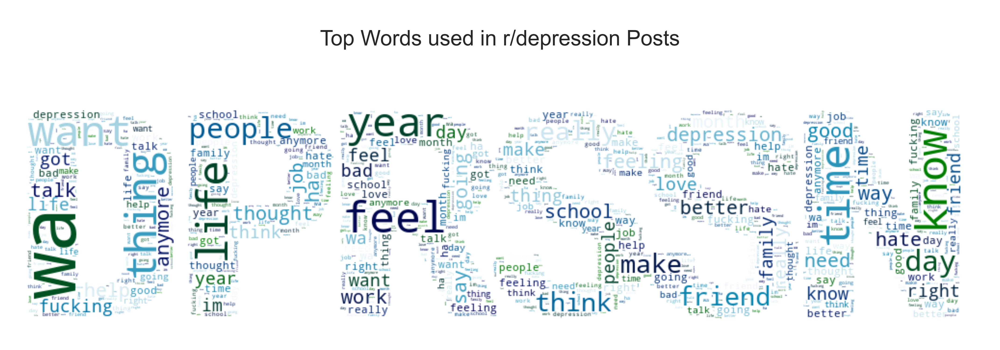

/var/folders/9h/x3gkqsdn68q_z6ktbkx8q5h00000gn/T/ipykernel_30269/1014932627.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y= top_20_words_df.index, x="count", data=top_20_words_df, palette = palette)


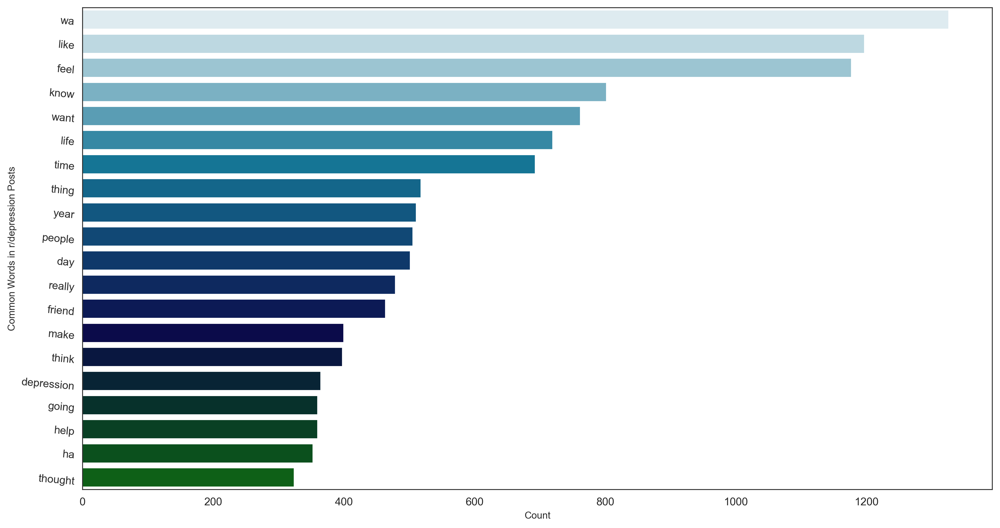

In [36]:
#CALLING THE FUNCTION ON r/depression POSTS
#WE'LL USE DIFFERENT PALETTES TO SEPERATE THE TWO REDDITS: 
#THE PENSIVE "ocean_r" FOR r/depression AND THE HEAVY AND DARK SHADES OF "magma" FOR FOR r/SuicideWatch 
plot_most_used_words("r/depression Posts", depression_posts, palette="ocean_r", image_mask="../assets/depression_mask.png")

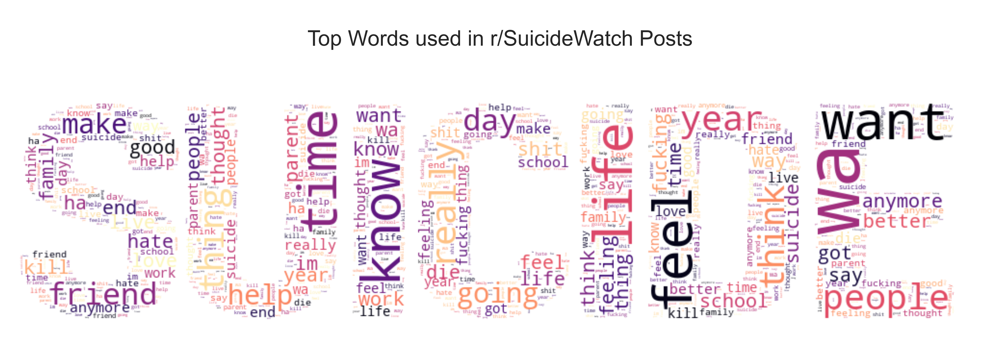

/var/folders/9h/x3gkqsdn68q_z6ktbkx8q5h00000gn/T/ipykernel_30269/1014932627.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y= top_20_words_df.index, x="count", data=top_20_words_df, palette = palette)


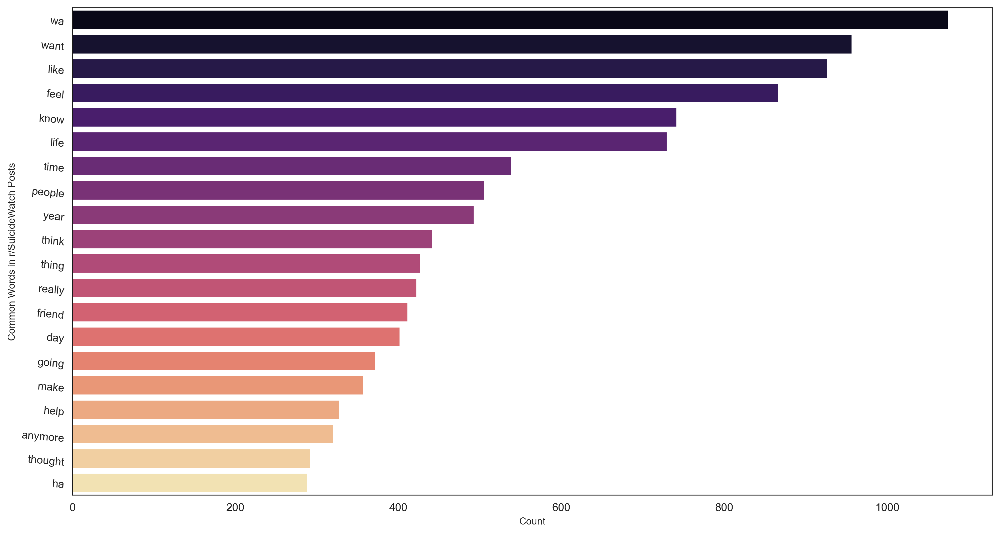

In [37]:
#CALLING THE FUNCTION ON r/SuicideWatch POSTS
plot_most_used_words("r/SuicideWatch Posts", suicide_posts, palette="magma", image_mask="../assets/suicide_mask.png")

#### Reviewing "Top Words" in posts
> **Many similar words** - We see a massive amount of similar words in our "top 20 words" from both subreddits like: wa, want, like, feel, life and people. This might make it difficult four our model. 

> **Unique words from r/depression** - "depression"

> **Unique words from r/SuicideWatch** - "anymore"

### 2.3.2 Top Words (subreddit Titles)
We will visualise the most-used words the our respective subreddit titles in a word cloud and a barplot. 

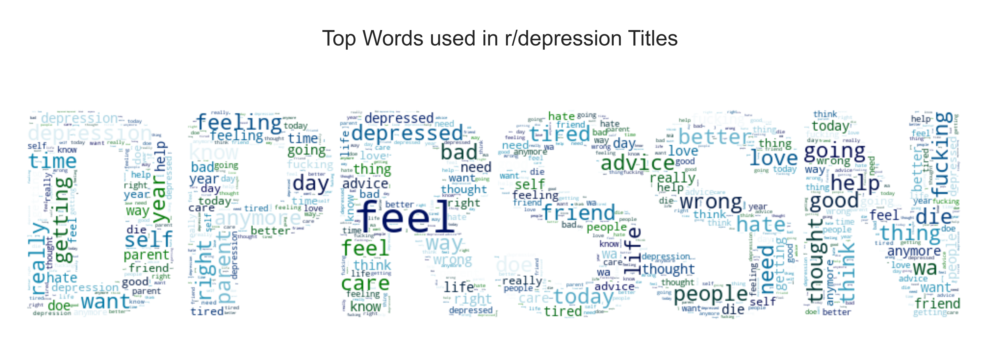

/var/folders/9h/x3gkqsdn68q_z6ktbkx8q5h00000gn/T/ipykernel_30269/1014932627.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y= top_20_words_df.index, x="count", data=top_20_words_df, palette = palette)


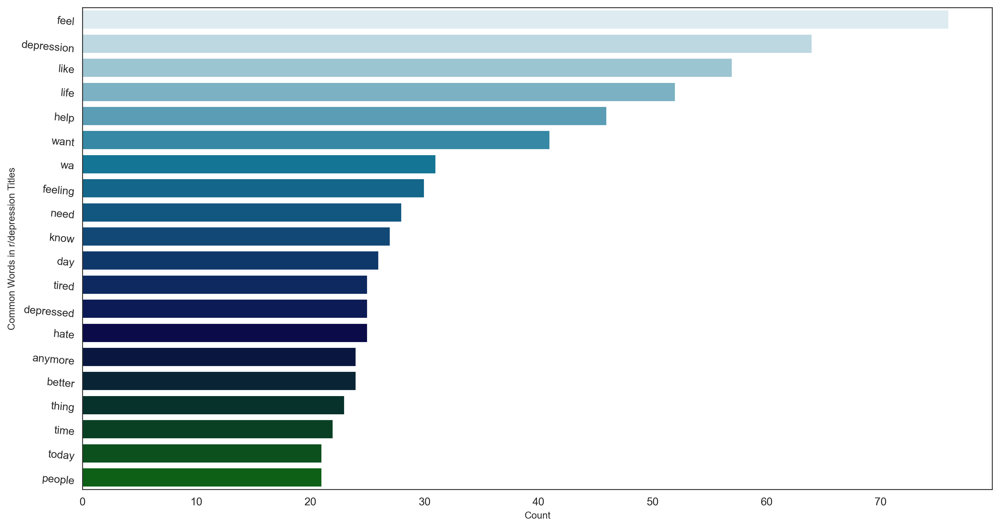

In [38]:
#CALLING THE FUNCTION ON r/depression TITLES
plot_most_used_words("r/depression Titles", depression_titles, palette="ocean_r", image_mask="../assets/depression_mask.png")

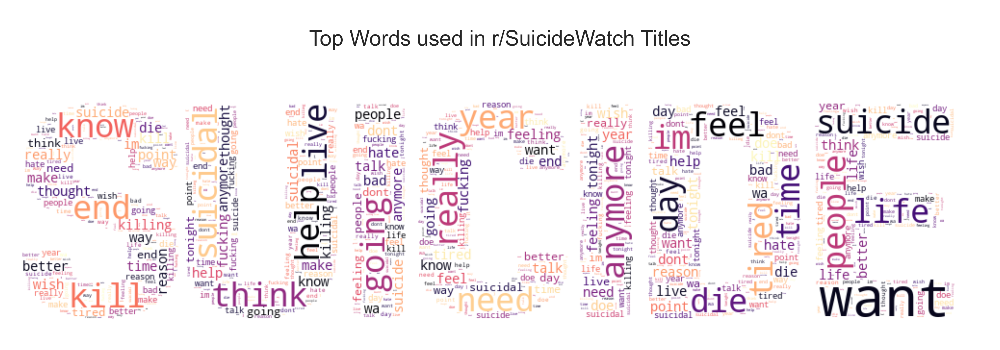

/var/folders/9h/x3gkqsdn68q_z6ktbkx8q5h00000gn/T/ipykernel_30269/1014932627.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y= top_20_words_df.index, x="count", data=top_20_words_df, palette = palette)


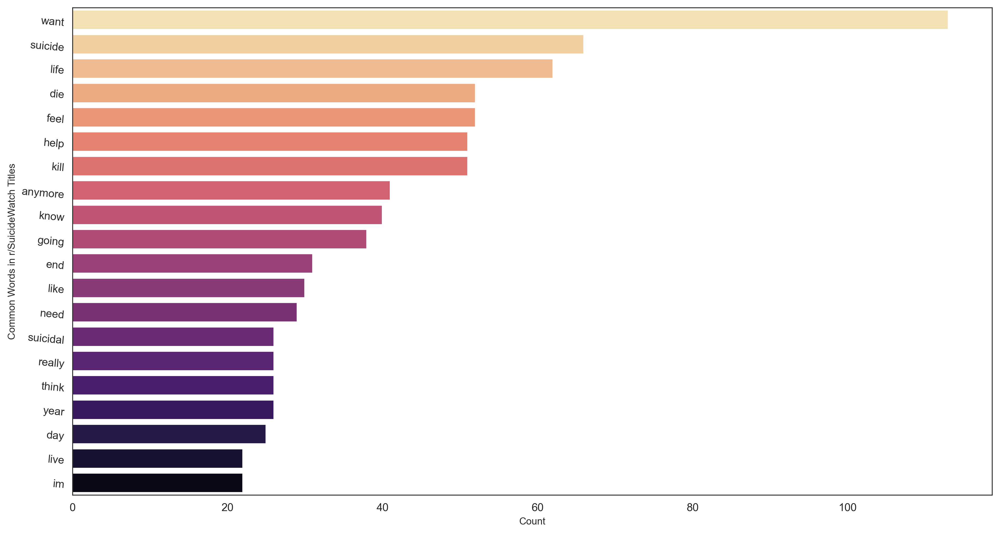

In [39]:
#CALLING THE FUNCTION ON r/SuicideWatch TITLES
plot_most_used_words("r/SuicideWatch Titles", suicide_titles, palette="magma_r", image_mask="../assets/suicide_mask.png")

#### Reviewing "Top Words" in titles
> **Titles a better differentiator?** - We still see a fair amount of similar words in our "top 20 words" in our titles, but much less than in Posts. As Titles in the two subreddits seem to differ more than Posts, it might serve as a better place for our models to hunt for features.

> **Unique words from r/depression titles** - "depression", "depressed", "hate"

> **Unique words from r/SuicideWatch titles** - "die", "kill", "suicidal", "live", "year"

> **The difference between Wanting and Feeling** - It is interesting to note that the top word in r/SuicideWatch is the word "want" and it is used more than twice compared to the word "feel". In r/depression, the top word is "feel" and similarly, is used close to twice the amount of times compared to "want". This trend is also reflected in our visualisations for posts. 

### 2.3.3 Top Words (subreddit Usernames)
We will visualise our most-used words in the respective subreddit usernames in a word cloud and a barplot. The choice of exploring usernames is an odd one as usernames are really short and it'll be really surprising if we can find something revealing in a sample pool of 1897 usernames. Let's try any way!

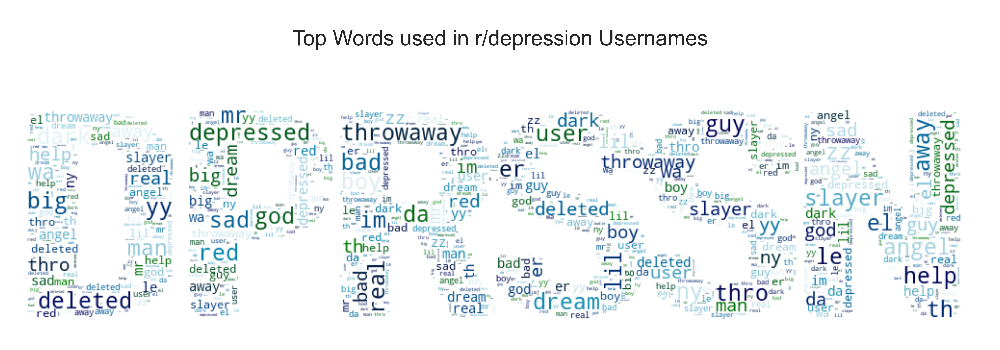

/var/folders/9h/x3gkqsdn68q_z6ktbkx8q5h00000gn/T/ipykernel_30269/1014932627.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y= top_20_words_df.index, x="count", data=top_20_words_df, palette = palette)


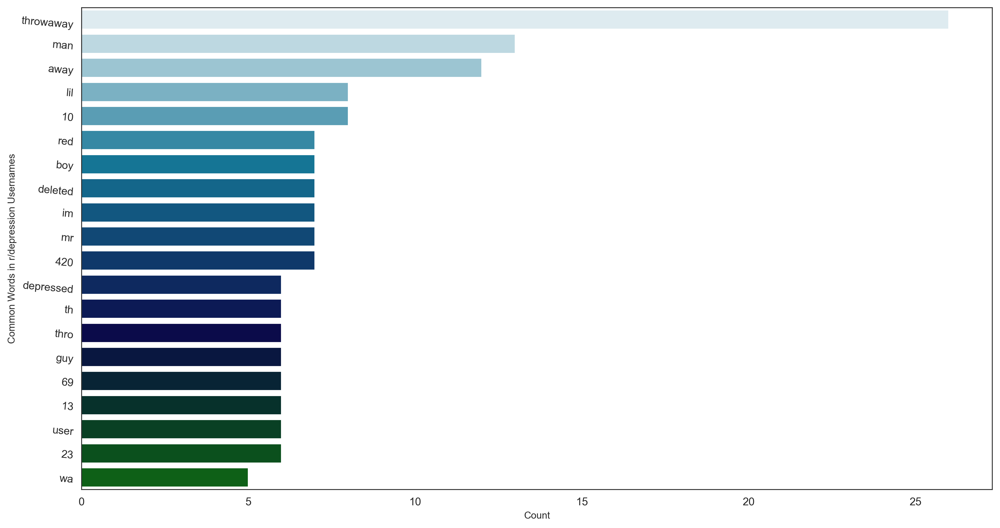

In [40]:
#CALLING THE FUNCTION ON r/depression USERNAMES
plot_most_used_words("r/depression Usernames", depression_authors, palette="ocean_r", image_mask="../assets/depression_mask.png")

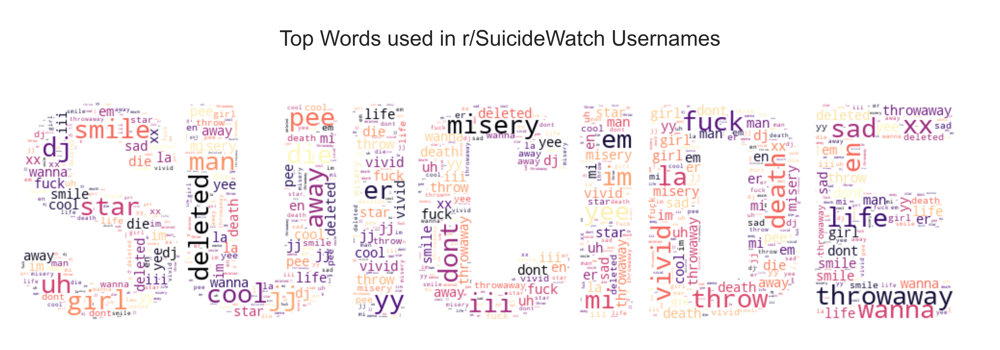

/var/folders/9h/x3gkqsdn68q_z6ktbkx8q5h00000gn/T/ipykernel_30269/1014932627.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(y= top_20_words_df.index, x="count", data=top_20_words_df, palette = palette)


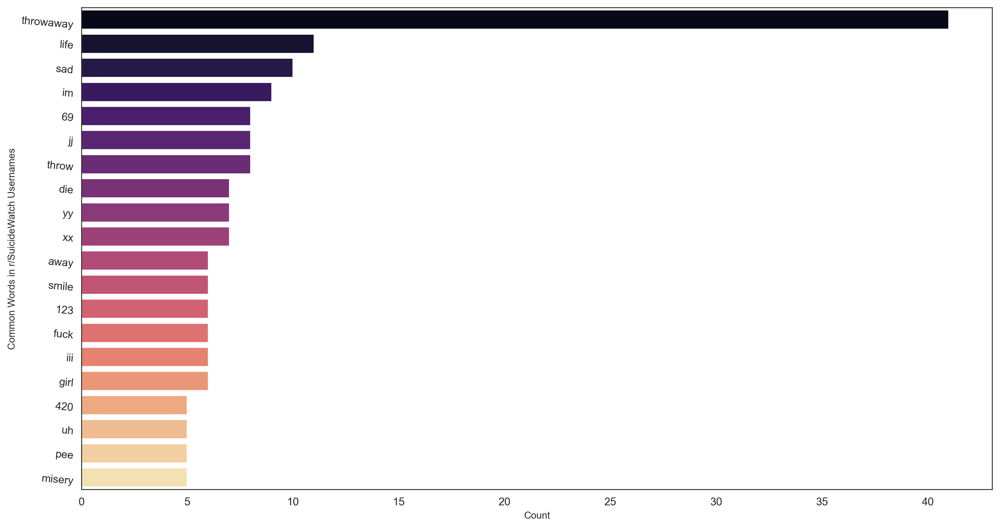

In [41]:
#CALLING THE FUNCTION ON r/SuicideWatch USERNAMES
plot_most_used_words("r/SuicideWatch Usernames", suicide_authors, palette="magma", image_mask="../assets/suicide_mask.png")

In [42]:
#CHECKING ON THE OCCURENCES OF "throwaway" IN USERNAMES
combined_data["author_clean"].str.contains("throwaway").sum()

67

In [43]:
#CHECKING ON THE OCCURENCES OF MALE-SIGNIFIERS IN r/depression USERNAMES
search_values = ["mr", "man", "boy", "guy", "dude"]
depression_authors.str.contains('|'.join(search_values)).sum()

39

In [44]:
#CHECKING ON THE OCCURENCES OF MALE-SIGNIFIERS IN r/SuicideWatch USERNAMES
search_values = ["mr", "man", "boy", "guy", "dude"]
suicide_authors.str.contains('|'.join(search_values)).sum()

29

In [45]:
#CHECKING ON THE OCCURENCES OF MALE-SIGNIFIERS IN ALL USERNAMES
search_values = ["mr", "man", "boy", "guy", "dude"]
combined_data["author_clean"].str.contains('|'.join(search_values)).sum()

68

In [46]:
#CHECKING ON THE OCCURENCES OF FEMALE-SIGNIFIERS IN ALL USERNAMES
search_values = ["ms", "woman", "girl", "gal", "lady"]
combined_data["author_clean"].str.contains('|'.join(search_values)).sum()

15

In [47]:
#CHECKING ON THE OCCURENCES OF "girl" IN IN r/SuicideWatch USERNAMES
suicide_authors[suicide_authors.str.contains("girl")]

1051        bay girl ad girl
1508       throwaway girl 83
1542    sad girl throwaway 6
1619    disposable baby girl
1836        crazy smile girl
Name: author_clean, dtype: object

In [48]:
#CHECKING OUT WHETHER THE OCCURENCES OF NUMBERS IS UNIQUE TO r/depression
depression_authors[depression_authors.str.contains(r"\d")].count()

323

In [49]:
#CHECKING OUT WHETHER THE OCCURENCES OF NUMBERS IS UNIQUE TO r/depression
#THE ANSWER IS NO. IN FACT, r/SuicideWatch HAS MORE USERNAMES WITH NUMBERS IN THEM
suicide_authors[suicide_authors.str.contains(r"\d")].count()

349

In [50]:
#420, OR FOUR-TWENTY IS SLANG FOR CANNABIS CONSUMPTION.
#CHECKING OUT USER NAMES WITH 420 IN THEM 
combined_data["author_clean"][combined_data["author_clean"].str.contains(r"420")]

14                  toasty 420
162            daniel quer 420
236      cereal 420 bla zi ken
302           taco cat 6942042
361              hyper aid 420
366                der bag 420
644          th icc barbie 420
772                su kari 420
811        mom destroyer 69420
1231            star rider 420
1277       penis wrinkle 69420
1388         th icc barbie 420
1433              spa main 420
1482    wiener schnitzel z 420
1710           fuck boi 420 69
Name: author_clean, dtype: object

In [51]:
len(combined_data["author_clean"])

1897

#### Reviewing "Top Words" in Usernames

> **Throwaways Dominate** - There are 67 accounts(out of 1897) with the word "throwaway" in it. Throwaway accounts are temporary accounts used by users who want to maintain some anonymity. This is understandable given the subject matter of mental health. 

> **Male-signifiers** - Our top 20 list for depression is dominated by usernames with "mr", "man", "boy", "guy" in them. A check in on our full list of authornames revealed that there are more male-related names(68) than female ones(15). Its not a strong link our finding, but it is worth noting that there is a gender paradox in suicide studies, which observes the phenomenon of women having more suicidal thoughts while men commit suicide more frequently. 

> **Marijuana** - The 420, or "four-twenty", cannabis code made its way into our top 20 for depression. It might be worthwhile to look for links to drug-use in our posts. 

> **Usefulness of Usernames?** - Although our discoveries in Usernames are interesting, the "Top Words" occur in an average of 5 usernames. This might give our model some trouble. "Title" is still my top choice as the column to use to search for features. 

### 2.3.4 Significant Authors 
As an attempt to understand the community in the pages, we will attempt check out users who post often and users who has posted on both subreddits.

In [52]:
#LOOKING AT AUTHORS WITH THE MOST POSTS
combined_data["author"].value_counts().head(20)

author
[deleted]           11
Vivid-Smile          5
snakesnack148        4
outakuslayer69       4
throaway8297338      4
SQLwitch             3
SuperDuperPewper     3
unicorn6642          3
vadimuha             3
missmisery8          3
SeaSaltSaw           3
AlinaAngelMtF        3
lIlFlashIlI          3
enk9898              3
LifeisCrumbling      3
TheGrandMan10        3
SilentPost3          3
tiredlucifer         2
log1992              2
Boogiedat            2
Name: count, dtype: int64

In [53]:
#READING THE POSTS BY AUTHORS WITH THE MOST POSTS
pd.set_option("display.max_colwidth", 1000)
combined_data[["is_suicide","author","title", "selftext"]][combined_data["author"].isin(['Vivid-Smile', 'throaway8297338', 'snakesnack148', 'outakuslayer69',
       'enk9898', 'SQLwitch'])].sort_values("author")

,is_suicide,author,title,selftext
0,0,SQLwitch,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first resort"", so we've made a new wiki to explain it","We understand that most people who reply immediately to an OP with an invitation to talk privately mean only to help, but this type of response usually leads to either disappointment or disaster. it usually works out quite differently here than when you say ""PM me anytime"" in a casual social context. \n\nWe have huge admiration and appreciation for the goodwill and good citizenship of so many of you who support others here and flag inappropriate content - even more so because we know that so many of you are struggling yourselves. We're hard at work behind the scenes on more information and resources to make it easier to give and get quality help here - this is just a small start. \n\nOur new wiki page explains in detail why it's much better to respond in public comments, at least until you've gotten to know someone. It will be maintained at /r/depression/wiki/private_contact, and the full text of the current version is below.\n\n*****\n\n###Summary###\n\n**Anyone who, while a..."
918,1,SQLwitch,Reminder: Absolutely no activism of any kind is allowed here. Any day.,"If you want to recognise an occasion, please do so by offering extra support to those who've asked for it, and by being a good citizen of the community, mindful of our tips and guidelines.\n\nEdit: In response to multiple requests, I'm adding a definition of activism here: ""campaigning to bring about political or social change"". That's straight out of the OED, we aren't making any special interpretation of it. **Any post that is primarily about raising awareness or changing perceptions is activism according to the dictionary definition and thus a violation of the community rules.**\n\nSome examples of the most common types of activists posts we were here, all of which are totally inappropriate: \n\n* Advocating for changes in laws around suicide\n\n* Advocating for change in the mental-health system \n\n* Advocating for changes in cultural norms or common perceptions around mental-health. These are often related to specific days devoted to specific causes, e.g. World Suicide P..."
917,1,SQLwitch,"New wiki on how to avoid accidentally encouraging suicide, and how to spot covert incitement","We've been seeing a worrying increase in pro-suicide content showing up here and, and also going unreported. This undermines our purpose here, so we wanted to highlight and clarify our guidelines about both direct and indirect incitement of suicide. \n\nWe've created a wiki that covers these issues. We hope this will be helpful to anyone who's wondering whether something's okay here and which responses to report. It explains in detail why *any* validation of suicidal intent, even an ""innocent"" message like ""if you're 100% committed, I'll just wish you peace"" is likely to increase people's pain, and why it's important to report even subtle pro-suicide comments. The full text of the wiki's current version is below, and it is maintained at [/r/SuicideWatch/wiki/incitement](http://www.reddit.com/r/SuicideWatch/wiki/incitement). \n\nWe deeply appreciate everyone who gives responsive, empathetic, non-judgemental support to our OPs, and we particularly thank everyone who's already been..."
1515,1,Vivid-Smile,Can't forget the girl I love since high school,"I can't forget her. I love her. I want her so much \n\nBut she hates me. Blocked for a year.\n\nI'm 25 and never had a relationship \n\n\nI feel humiliated that I never got a proper chance \n\nIf I can't be with her, I will kill myself"
1241,1,Vivid-Smile,I'm going to end my life over a girl,That's it.\n\n\nI can't stand it anymore. \n\nIt's my family's fault and they refuse to keep promises
1218,1,Vivid-Smile,That's it. I'm going to kill myself tomorrow,"My ""family"" destroyed my life\n\n\nI'll never see the girl I like because of th

In [54]:
#READING THE POSTS BY AUTHORS WITH DELETED NAMES/ACCOUNTS
pd.set_option("display.max_colwidth", 1000)
combined_data[["is_suicide","author","title", "selftext"]][combined_data["author"].isin(["[deleted]"])].sort_values("author")

,is_suicide,author,title,selftext
278,0,[deleted],I'm tired of the pain.,"I just can not keep doing this anymore. I keep reaching out for help, doctors push pills on me (I'm on five now) and therapists just try to push me into blaming my dead father. \n\nI can't afford my home. I can't afford my bills. I can't afford food and even the subreddits that claim to offer help just delete my posts because I lurk and my account doesn't have hundreds of karma.\n\nI do not know what to do. I cry constantly. I hate my life and myself. I can't sleep I can't eat. \n\nI try to open up to people and they look at me like a monster.\n\nI am a monster.\n\nI'm about to lose my home and I have nothing left to sell to try to hang on to it. I sold all my dads belongings to make ends meet, he left those to me so I could have a good fun life and here I am a piece of garbage who can't even work a part time job to buy groceries. \n\nThe state turns me away because I have income ($944/mo in disability).\n\nI'm done. I can't do this. Why am I fighting? For who? I'm alone. My chest ..."
329,0,[deleted],"I’ve lost 4 pounds since Monday, this is just getting worse","I don’t like to complain and so I don’t talk about my depression a lot to my friends/loved ones, I don’t want to worry them or be annoying. It’s been getting progressively worse recently though, I’m dropping weight like crazy (I’ve never had it interfere with weight before), when I do try to talk about it, things get minimized and nobody really gives a f*ck. I had my s/o tell me that I was “not really sad” yesterday, and that messed with me because not only has he not known me for the majority of my life, but just because I don’t like to talk about my problems doesn’t mean they don’t exist. He really has no idea. My mom is a therapist so when I try to talk to her she just gets overly worried, and my dad generally follows her lead with that. I understand why they worry, a couple years ago I had a pretty bad suicide attempt and a near fatal overdose (od was an accident, I was just being dumb) within less than 6 months of each other, they worry that it’ll happen again. It gets annoyin..."
417,0,[deleted],I'm tired of all the noise,I think I get misinterpreted a lot. I don't feel good. I'm selfish but I need validation too. My things matter but so do yours. I just need to find the right meds.
498,0,[deleted],Totally burned out and extrem depressed,So im going to tell you a „little“ about my Situation. I am usually a pretty happy Person. I like doing fun Things like going out with Friends who ive known pretty much all my life (im 23 ) and i have a passion which Is Film making. But Since i started with school even at a Young age i always had Problems concentrating and focusing at School it just isnt for me because I don’t see the benefits from it. I also think the school system is extremly outdated. Last September I started my education ( I live in Germany and the English word for ausbildung translates to education.. ) I work in a world known firm which im not going to name because of a couple of reasons which aren’t related to my problem though. I would say it’s pretty fun because all of my co workers and bosses are pretty nice and always want me to succeed and do good. I’m also pretty good at this job. Even though I got a lot for me going in this particular job I don’t really see me self working in this job for the rest of m...
512,0,[deleted],I’m losing myself.,"I can’t keep going.\n\nI try and try to be a good person and every time I turn around the world takes something from me. I can’t afford to live anymore. The state of the world makes me sick. My family is so splintered. I lost my dad and my mother is so beyond done dealing with my messed up self it makes my chest hurt.\n\nI never wanted to be this. I wanted to make my family’s life better but here I am a failed 38 year old man who can’t even support himself let alone help those I love.\n\nI don’t know where to turn. Doctors push so many drug

In [56]:
#ISOLATING AUTHORS WHO HAVE POSTED MORE THAN ONCE
df_author_counts = pd.DataFrame(combined_data["author"].value_counts())
df_author_counts.reset_index(level=0, inplace=True)
df_author_counts.columns = ["author", "post_count"]

authors_posting_more_than_once = list(df_author_counts[df_author_counts["post_count"] > 1]["author"])

In [58]:
# USING MASKS AND SLICES TO FISH OUT AUTHORS WHO HAVE POSTED IN BOTH subreddits
pd.set_option("display.max_colwidth", 100)

# CALCULATING MEAN ONLY FOR is_suicide (numeric column)
more_than_once_mean_df = (
    combined_data[combined_data["author"].isin(authors_posting_more_than_once)]
    .groupby("author")["is_suicide"]
    .mean()
    .reset_index()
)

# CREATING MASK TO ISOLATE REDDITORS WHO HAVE POSTED IN BOTH FORUMS
double_posters_mask = (more_than_once_mean_df["is_suicide"] != 0) & (more_than_once_mean_df["is_suicide"] != 1.0)
double_posters = more_than_once_mean_df[double_posters_mask]

# ADDING COMMENT COUNTS BACK FOR SORTING
double_posters = double_posters.merge(
    combined_data.groupby("author")["num_comments"].sum().reset_index(),
    on="author"
).sort_values("num_comments", ascending=False)

# PRINT COUNT OF DOUBLE POSTERS
print(len(double_posters))

# CREATING LIST OF TOP 7 DOUBLE POSTERS BY COMMENTS
top_double_posters_list = list(double_posters["author"].head(7))
top_double_posters_list

27


['SQLwitch',
 'buhrainbow',
 '[deleted]',
 'dereulb',
 'RegularlyAlive',
 'deppressionthrowaway',
 'vadimuha']

In [59]:
#THERE ARE 27 REDDITORS WHO HAVE POSTED ON BOTH FORUMS BEFORE
#WE CAN'T LOOK AT ALL THE POSTS BUT LETS LOOK AT THE TOP 7 WHO HAVE RECEIVED THE MOST COMMENTS
pd.set_option("display.max_colwidth", 1000)
combined_data[["is_suicide","author","title", "selftext","url"]][combined_data["author"].isin(top_double_posters_list)].sort_values("author")
    

,is_suicide,author,title,selftext,url
135,0,RegularlyAlive,Pretty sure my life is falling apart.,I'm a fucking burden on everyone. Idk why there's still like 5 people that care. I wish they didn't so I could just fucking die already,https://www.reddit.com/r/depression/comments/fegjav/pretty_sure_my_life_is_falling_apart/
1257,1,RegularlyAlive,Does anyone else feel destined to die by suicide?,"It sounds emo and cringy as hell, but I've felt this way for 8 years. Meh",https://www.reddit.com/r/SuicideWatch/comments/fd8tmk/does_anyone_else_feel_destined_to_die_by_suicide/
0,0,SQLwitch,"Our most-broken and least-understood rules is ""helpers may not invite private contact as a first resort"", so we've made a new wiki to explain it","We understand that most people who reply immediately to an OP with an invitation to talk privately mean only to help, but this type of response usually leads to either disappointment or disaster. it usually works out quite differently here than when you say ""PM me anytime"" in a casual social context. \n\nWe have huge admiration and appreciation for the goodwill and good citizenship of so many of you who support others here and flag inappropriate content - even more so because we know that so many of you are struggling yourselves. We're hard at work behind the scenes on more information and resources to make it easier to give and get quality help here - this is just a small start. \n\nOur new wiki page explains in detail why it's much better to respond in public comments, at least until you've gotten to know someone. It will be maintained at /r/depression/wiki/private_contact, and the full text of the current version is below.\n\n*****\n\n###Summary###\n\n**Anyone who, while a...",https://www.reddit.com/r/depression/comments/doqwow/our_mostbroken_and_leastunderstood_rules_is/
918,1,SQLwitch,Reminder: Absolutely no activism of any kind is allowed here. Any day.,"If you want to recognise an occasion, please do so by offering extra support to those who've asked for it, and by being a good citizen of the community, mindful of our tips and guidelines.\n\nEdit: In response to multiple requests, I'm adding a definition of activism here: ""campaigning to bring about political or social change"". That's straight out of the OED, we aren't making any special interpretation of it. **Any post that is primarily about raising awareness or changing perceptions is activism according to the dictionary definition and thus a violation of the community rules.**\n\nSome examples of the most common types of activists posts we were here, all of which are totally inappropriate: \n\n* Advocating for changes in laws around suicide\n\n* Advocating for change in the mental-health system \n\n* Advocating for changes in cultural norms or common perceptions around mental-health. These are often related to specific days devoted to specific causes, e.g. World Suicide P...",https://www.reddit.com/r/SuicideWatch/comments/d2370x/reminder_absolutely_no_activism_of_any_kind_is/
917,1,SQLwitch,"New wiki on how to avoid accidentally encouraging suicide, and how to spot covert incitement","We've been seeing a worrying increase in pro-suicide content showing up here and, and also going unreported. This undermines our purpose here, so we wanted to highlight and clarify our guidelines about both direct and indirect incitement of suicide. \n\nWe've created a wiki that covers these issues. We hope this will be helpful to anyone who's wondering whether something's okay here and which responses to report. It explains in detail why *any* validation of suicidal intent, even an ""innocent"" message like ""if you're 100% committed, I'll just wish you peace"" is likely to increase people's pain, and why it's important to report even subtle pro-suicide comments. The full text of the wiki's current version is below, and it is maintained at [/r/SuicideWatch/wiki/incitement](http://www.reddit.com/r/SuicideWatch/wiki/incitement). \n\nWe deeply appreciate every

#### Reviewing Significant Authors

> **The Moderator** - The redditor SQLWitch seems to be a moderating presence in both subreddits. Appearing a couple of times to remind redditors about rules like non-activism and not posting pro-suicide posts. SQLWitch's posts hints at the culture both communities, which are similar help-seeking, problem-airing forums. 

> **Double-Posting** - Aside from SQLWitch, there are more than 26 other users who have posted on both forums. For example, u/thathumbletrashcan posted on r/depression on March 4th that "*I don't want to die, but I don't want to live anymore*" . A day later, u/thathumbletrashcan visits the r/SuicideWatch forum and posts "*I've finally given in. This is it I guess, I've finally grown the balls to fulfil my plan......all of you won't have to deal with me again*." It seems that users treat r/SuicideWatch as a "late-stage" forum or a place to bid farewell to their fellow help-seekers. It might be useful to dig into the language used by these users prior to their "farewells" as the "shift" in their choice of words is exactly what we're looking for.  

### 2.3.5 Length of posts
We have already noticed a significant number of posts with no words in r/SuicideWatch posts. We should dive in to check out what the number of words are in an average post in each subreddit.  

In [60]:
combined_data["selftext_length"]= [len(combined_data["selftext"][i]) for i in range(len(combined_data))]

In [61]:
combined_data["title_length"]= [len(combined_data["title"][i]) for i in range(len(combined_data))]

In [62]:
ave_length_dep_title = combined_data["title_length"][combined_data["is_suicide"] ==0].mean()
ave_length_sui_title = combined_data["title_length"][combined_data["is_suicide"] ==1].mean()
ave_length_dep_post = combined_data["selftext_length"][combined_data["is_suicide"] ==0].mean()
ave_length_sui_post = combined_data["selftext_length"][combined_data["is_suicide"] ==1].mean()

print("Average length of a r/depression title: {}".format(ave_length_dep_title))
print("Average length of a r/SuicideWatch title: {}".format(ave_length_sui_title))
print("Average length of a r/depression post: {}".format(ave_length_dep_post))
print("Average length of a r/SuicideWatch post: {}".format(ave_length_sui_post))

Average length of a r/depression title: 39.31952017448201
Average length of a r/SuicideWatch title: 39.72244897959184
Average length of a r/depression post: 964.3217011995638
Average length of a r/SuicideWatch post: 836.3602040816327


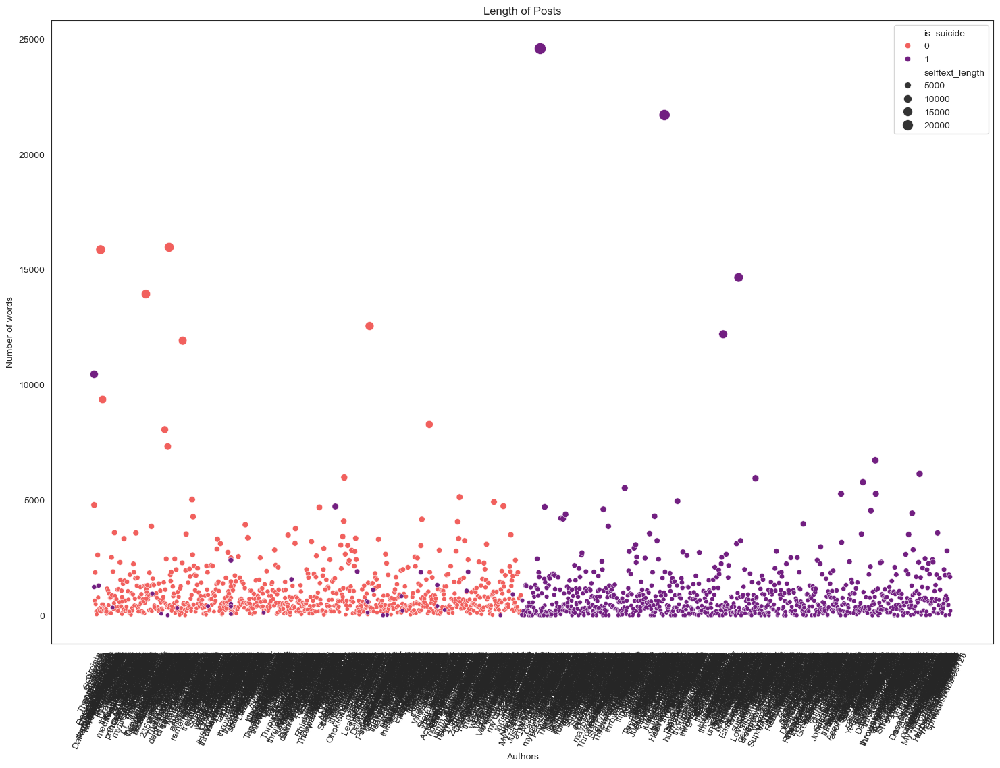

In [63]:
#CREATING A SCATTERPLOT TO VISUALISE LENGTH OF POSTS
sns.set_style("white")
plt.figure(figsize = (18, 12))
sns.scatterplot(data =combined_data,
               y = "selftext_length", 
               x = "author",
               hue = 'is_suicide', 
               palette = "magma_r",
               size = 'selftext_length',
               sizes=(20, 150));
plt.title("Length of Posts");
plt.xlabel("Authors");
plt.ylabel("Number of words");
plt.xticks(rotation=65);

#### Reviewing Length of Posts

> **Longer r/depression posts** - The average length of r/depression posts is almost 130 words shorter than that of r/SuicideWatch. Although, as we can see from our scatterplot above, this figures might be skewed by some extremely long posts and the presence of empty posts in r/SuicideWatch. 



### 2.3.6 Using Scattertext to visualise our corpus
As a final step in our EDA, we will use Scattertext to produce a user-friendly way of visualising our corpus in HTML.

In [64]:
#CREATING A megatext COLUMN
combined_data["megatext_clean"]=combined_data["author_clean"] + " " + combined_data["selftext_clean"]+ " " +combined_data["title_clean"]

In [65]:
#CREATING A DATAFRAME FOR SCATTERTEXT
scatter_data = combined_data[["megatext_clean", "is_suicide"]]
scatter_data["category"] = scatter_data["is_suicide"].map({0: "Depression", 1: "Suicide"})
scatter_data.tail()

/var/folders/9h/x3gkqsdn68q_z6ktbkx8q5h00000gn/T/ipykernel_30269/3983185443.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scatter_data["category"] = scatter_data["is_suicide"].map({0: "Depression", 1: "Suicide"})


,megatext_clean,is_suicide,category
1892,big pete 543 hard get bed every morning right want die damn hard alive world want keep going want keep fighting wish would end could peace ever asked life wa love ever wanted wa love world took request turned back form million dagger heart bear want die much pain,1,Suicide
1893,eli sbt low iq twice tested time got iq around 84 85 somehow entirely awful school wa able b student without much studying actually started studying started get grade 90 even 100 even though skimmed exemplary grade barely retained learned nobody around belief stupid grade go poor vocabulary overall especially spoken word cannot basic mental math still count finger nineteen year old low income uneducated family wa innately disadvantaged birth also mom smoke weed cigarette throughout pregnancy 8th month pregnancy detached placenta preform emergency c section likely brain damage oxygen deprivation feel incredibly empty every moment awake favorite time day go sleep night night always go quickly lately spending everyday sleeping much joy dream want least average intelligence least unbearable aware every moment dumb ever dumb always aspired leave financial hole everyday pass reminds probably never happen point feel like stuck rock hard place terrified leave behind family pet know continu...,1,Suicide
1894,gay h ovum feel useless im useless useless,1,Suicide
1895,ev e wish wa way could non existence regret entire life know take last breath matter hand regret life stopping know would probably kill dad want daughter feel like would better without would want mom like doormat everyone go people tell whenever ask help get thrown back face point anymore sacrifice enough say even though life anymore even room breathe love selfish selfish wish hd jsut hour week something productive get rid noise let breathe already asked help fault fault making time one seems understand matter much explain much ask help breaking anyone understand doormat doormat even stand try doormat shit get stomped even deeper every fiber feel like agony agony agony regret everything fucking miserable miserable miserable wish never existed wish never made tie life awful would anyone ever sentient creature life fuckkng horrible long living like agony terrible mother sacrifice enough wish never existed never knew anyone one ever knew wish wa easy disappearing thin air trace memory...,1,Suicide
1896,pon k ichi want die think want feel pain want feel something death way get sorry posting much today anyways im torn rn dont know right,1,Suicide


In [66]:
#PARSING TEXT FOR SCATTERTEXT
nlp = st.whitespace_nlp_with_sentences
scatter_data.groupby("category").apply(lambda x: x.megatext_clean.apply(lambda x: len(x.split())).sum())
scatter_data['parsed'] = scatter_data.megatext_clean.apply(nlp)
scatter_data.tail()

/var/folders/9h/x3gkqsdn68q_z6ktbkx8q5h00000gn/T/ipykernel_30269/603118289.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scatter_data['parsed'] = scatter_data.megatext_clean.apply(nlp)


,megatext_clean,is_suicide,category,parsed
1892,big pete 543 hard get bed every morning right want die damn hard alive world want keep going want keep fighting wish would end could peace ever asked life wa love ever wanted wa love world took request turned back form million dagger heart bear want die much pain,1,Suicide,"(big, pete, 543, hard, get, bed, every, morning, right, want, die, damn, hard, alive, world, want, keep, going, want, keep, fighting, wish, would, end, could, peace, ever, asked, life, wa, love, ever, wanted, wa, love, world, took, request, turned, back, form, million, dagger, heart, bear, want, die, much, pain)"
1893,eli sbt low iq twice tested time got iq around 84 85 somehow entirely awful school wa able b student without much studying actually started studying started get grade 90 even 100 even though skimmed exemplary grade barely retained learned nobody around belief stupid grade go poor vocabulary overall especially spoken word cannot basic mental math still count finger nineteen year old low income uneducated family wa innately disadvantaged birth also mom smoke weed cigarette throughout pregnancy 8th month pregnancy detached placenta preform emergency c section likely brain damage oxygen deprivation feel incredibly empty every moment awake favorite time day go sleep night night always go quickly lately spending everyday sleeping much joy dream want least average intelligence least unbearable aware every moment dumb ever dumb always aspired leave financial hole everyday pass reminds probably never happen point feel like stuck rock hard place terrified leave behind family pet know continu...,1,Suicide,"(eli, sbt, low, iq, twice, tested, time, got, iq, around, 84, 85, somehow, entirely, awful, school, wa, able, b, student, without, much, studying, actually, started, studying, started, get, grade, 90, even, 100, even, though, skimmed, exemplary, grade, barely, retained, learned, nobody, around, belief, stupid, grade, go, poor, vocabulary, overall, especially, spoken, word, cannot, basic, mental, math, still, count, finger, nineteen, year, old, low, income, uneducated, family, wa, innately, disadvantaged, birth, also, mom, smoke, weed, cigarette, throughout, pregnancy, 8th, month, pregnancy, detached, placenta, preform, emergency, c, section, likely, brain, damage, oxygen, deprivation, feel, incredibly, empty, every, moment, awake, favorite, time, day, ...)"
1894,gay h ovum feel useless im useless useless,1,Suicide,"(gay, h, ovum, feel, useless, im, useless, useless)"
1895,ev e wish wa way could non existence regret entire life know take last breath matter hand regret life stopping know would probably kill dad want daughter feel like would better without would want mom like doormat everyone go people tell whenever ask help get thrown back face point anymore sacrifice enough say even though life anymore even room breathe love selfish selfish wish hd jsut hour week something productive get rid noise let breathe already asked help fault fault making time one seems understand matter much explain much ask help breaking anyone understand doormat doormat even stand try doormat shit get stomped even deeper every fiber feel like agony agony agony regret everything fucking miserable miserable miserable wish never existed wish never made tie life awful would anyone ever sentient creature life fuckkng horrible long living like agony terrible mother sacrifice enough wish never existed never knew anyone one ever knew wish wa easy disappearing thin air trace memory...,1,Suicide,"(ev, e, wish, wa, way, could, non, existence, regret, entire, life, know, take, last, breath, matter, hand, regret, life, stopping, know, would, probably, kill, dad, want, daughter, feel, like, would, better, without, would, want, mom, like, doormat, everyone, go, people, tell, whenever, ask, help, get, thrown, back, face, point, anymore, sacrifice, enough, say, even, though, life, anymore, even, room, breathe, love, selfish, selfish, wish, hd, j

In [67]:
#DEFINING A CORPUS FOR SCATTERTEXT VISUALISATION
corpus = st.CorpusFromParsedDocuments(scatter_data, category_col="category", parsed_col="parsed").build()

In [68]:
#CREATING A SCATTERTEXT PLOT
html = produce_scattertext_explorer(corpus,
                                    category='Depression',
                                    category_name='Depression',
                                    not_category_name='Suicide',
                                    width_in_pixels=1000,
                                    jitter=0.1,
                                    minimum_term_frequency=5,
                                    transform=st.Scalers.percentile,
                                    metadata=scatter_data['category']
                                   )
file_name = '../assets/Reddit_ScattertextRankDataJitter.html'
open(file_name, 'wb').write(html.encode('utf-8'))
IFrame(src=file_name, width = 1200, height=700)

In [69]:
#CHECKING IF OUR NEWER COLUMNS INTRODUCED MISSING DATA INTO OUR DATASET
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1897 entries, 0 to 1896
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   title            1897 non-null   object
 1   selftext         1897 non-null   object
 2   author           1897 non-null   object
 3   num_comments     1897 non-null   int64 
 4   is_suicide       1897 non-null   int64 
 5   url              1897 non-null   object
 6   selftext_clean   1897 non-null   object
 7   title_clean      1897 non-null   object
 8   author_clean     1897 non-null   object
 9   selftext_length  1897 non-null   int64 
 10  title_length     1897 non-null   int64 
 11  megatext_clean   1897 non-null   object
dtypes: int64(4), object(8)
memory usage: 178.0+ KB


#### NOTE: I've commented out the code in the next cell for "pd.to_csv" to prevent any accidental overwriting of the the saved dataset.**

In [70]:
#SAVING combined_data
#combined_data.to_csv('../data/data_for_model.csv', index = False)